In [1]:
# importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import statsmodels.api as sma
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

In [2]:
# Loading the training dataset
df_train=pd.read_csv('C:/USERS/YASHN/HOUSING TRAIN.CSV')
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


In [3]:
#displaying the max columns
pd.set_option("display.max_columns",None)
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [4]:
# Checking the basic information of the dataset
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [5]:
# Checking the dimensions of the training dataset
df_train.shape

(1168, 81)

In [6]:
# Checking the columns of the dataset
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [7]:
# Checking the null values of train dataset
pd.set_option('Display.max_rows', None)

df_train.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

<AxesSubplot:>

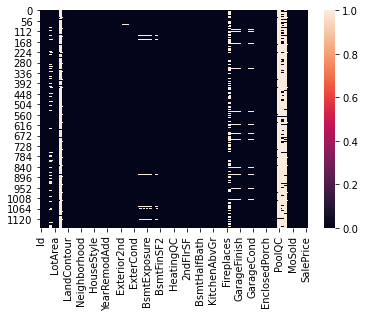

In [8]:
# plotting heatmap
sns.heatmap(df_train.isnull())

Here we can see there are null values in our dataset , which we need to handle.

In [9]:
# Filling missing values with mean in continuous columns
df_train['LotFrontage']=df_train['LotFrontage'].fillna(df_train['LotFrontage'].mean())
df_train['MasVnrArea'].fillna(df_train['MasVnrArea'].median(),inplace=True)

In [10]:
df_train['BsmtQual']=df_train['BsmtQual'].fillna(df_train['BsmtQual'].mode()[0])
df_train['BsmtCond']=df_train['BsmtCond'].fillna(df_train['BsmtCond'].mode()[0])
df_train['FireplaceQu']=df_train['FireplaceQu'].fillna(df_train['FireplaceQu'].mode()[0])
df_train['GarageType']=df_train['GarageType'].fillna(df_train['GarageType'].mode()[0])
df_train['GarageFinish']=df_train['GarageFinish'].fillna(df_train['GarageFinish'].mode()[0])
df_train['GarageQual']=df_train['GarageQual'].fillna(df_train['GarageQual'].mode()[0])
df_train['GarageCond']=df_train['GarageCond'].fillna(df_train['GarageCond'].mode()[0])

In [11]:
df_train.drop(['Alley'],axis=1,inplace=True)
df_train.drop(['GarageYrBlt'],axis=1,inplace=True)
df_train.drop(['PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [12]:
# Let's fill the missing values of MasVnrType with None

df_train['MasVnrType'] = df_train['MasVnrType'].fillna('None')

In [13]:
# Let's fill the missing values in categorical columns as NA

columns = ["BsmtExposure", "BsmtFinType2", "BsmtFinType1"]
df_train[columns] = df_train[columns].fillna('NA')

In [14]:
# Rechecking the null values
pd.set_option('Display.max_rows', None)

df_train.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

<AxesSubplot:>

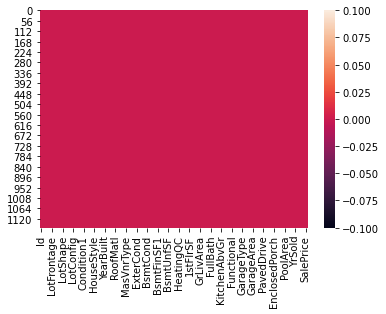

In [15]:
# plotting heatmap
sns.heatmap(df_train.isnull())

In [16]:
# checking the unique values
df_train.nunique()


Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       107
LotArea           892
Street              2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        5
BsmtFinType1        7
BsmtFinSF1        551
BsmtFinType2        7
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFinSF       21
GrLivArea 

array([[<AxesSubplot:title={'center':'Id'}>,
        <AxesSubplot:title={'center':'MSSubClass'}>,
        <AxesSubplot:title={'center':'LotFrontage'}>,
        <AxesSubplot:title={'center':'LotArea'}>,
        <AxesSubplot:title={'center':'OverallQual'}>,
        <AxesSubplot:title={'center':'OverallCond'}>,
        <AxesSubplot:title={'center':'YearBuilt'}>,
        <AxesSubplot:title={'center':'YearRemodAdd'}>,
        <AxesSubplot:title={'center':'MasVnrArea'}>,
        <AxesSubplot:title={'center':'BsmtFinSF1'}>],
       [<AxesSubplot:title={'center':'BsmtFinSF2'}>,
        <AxesSubplot:title={'center':'BsmtUnfSF'}>,
        <AxesSubplot:title={'center':'TotalBsmtSF'}>,
        <AxesSubplot:title={'center':'1stFlrSF'}>,
        <AxesSubplot:title={'center':'2ndFlrSF'}>,
        <AxesSubplot:title={'center':'LowQualFinSF'}>,
        <AxesSubplot:title={'center':'GrLivArea'}>,
        <AxesSubplot:title={'center':'BsmtFullBath'}>,
        <AxesSubplot:title={'center':'BsmtHalfBath'}>

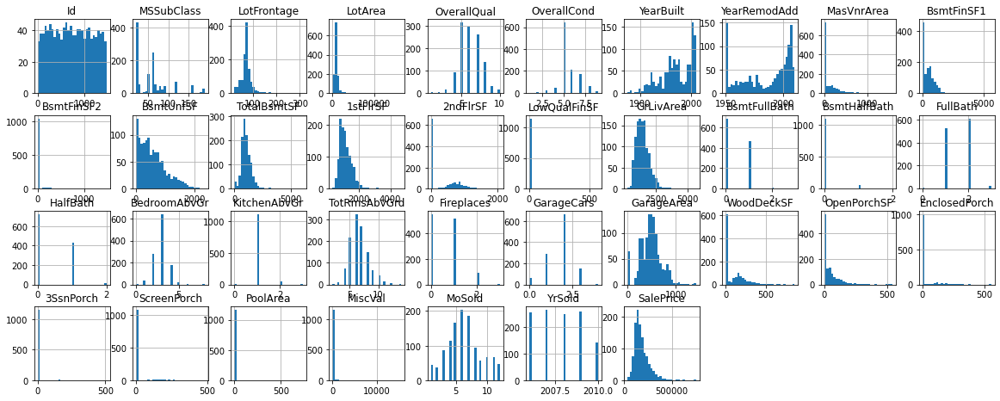

In [17]:
# plotting a histogram
df_train.hist(figsize=(20,20), grid = True, layout = (10,10), bins = 30)

In [18]:
# Checking Correlation
df_train.corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.004259,-0.005969,-0.029212,-0.036965,0.039761,-0.016942,-0.018590,-0.061397,0.003868,0.005269,-0.019494,-0.013812,0.009647,-0.029671,-0.070180,-0.024325,0.023027,-0.043572,-0.015187,-0.028512,0.009376,0.001216,-0.001613,-0.024175,0.007549,0.010048,-0.027498,-0.013642,0.004885,-0.021773,0.005169,0.065832,0.001304,0.023479,-0.008853,-0.023897
MSSubClass,0.004259,1.000000,-0.336681,-0.124151,0.070462,-0.056978,0.023988,0.056618,0.028215,-0.052236,-0.062403,-0.134170,-0.214042,-0.227927,0.300366,0.053737,0.086448,0.004556,0.008207,0.140807,0.168423,-0.013283,0.283506,0.051179,-0.035792,-0.027639,-0.092408,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,0.009583,-0.023503,-0.016015,-0.038595,-0.060775
LotFrontage,-0.005969,-0.336681,1.000000,0.299452,0.229218,-0.047573,0.112655,0.088799,0.188108,0.228996,0.002159,0.113924,0.356107,0.403436,0.089675,0.007506,0.374251,0.094046,0.001389,0.171773,0.047816,0.237199,-0.002729,0.318771,0.230610,0.260252,0.322644,0.088334,0.151328,0.020902,0.051084,0.030405,0.196001,-0.001329,0.022517,-0.003885,0.323779
LotArea,-0.029212,-0.124151,0.299452,1.000000,0.107188,0.017513,0.005506,0.027228,0.120192,0.221851,0.056656,0.006600,0.259733,0.312843,0.059803,-0.001915,0.281360,0.142387,0.059282,0.123197,0.007271,0.117351,-0.013075,0.184546,0.285983,0.158313,0.195162,0.216720,0.093080,-0.007446,0.025794,0.025256,0.097107,0.051679,0.015141,-0.035399,0.249499
OverallQual,-0.036965,0.070462,0.229218,0.107188,1.000000,-0.083167,0.575800,0.555945,0.403985,0.219643,-0.040893,0.308676,0.528285,0.458758,0.316624,-0.039295,0.599700,0.101732,-0.030702,0.548824,0.296134,0.099639,-0.178220,0.432579,0.390067,0.596322,0.566782,0.227137,0.341030,-0.098374,0.045919,0.059387,0.072247,-0.025786,0.090638,-0.048759,0.789185
OverallCond,0.039761,-0.056978,-0.047573,0.017513,-0.083167,1.000000,-0.377731,0.080669,-0.135133,-0.028810,0.044336,-0.146384,-0.162481,-0.134420,0.036668,0.041877,-0.065006,-0.039680,0.091016,-0.171931,-0.052125,0.028393,-0.076047,-0.039952,-0.013632,-0.161996,-0.126021,0.012290,-0.024899,0.056074,0.040476,0.069463,-0.003603,0.075178,0.005519,0.055517,-0.065642
YearBuilt,-0.016942,0.023988,0.112655,0.005506,0.575800,-0.377731,1.000000,0.592829,0.318562,0.227933,-0.027682,0.155559,0.386265,0.279450,0.011834,-0.189044,0.198644,0.164983,-0.028161,0.471264,0.243227,-0.080639,-0.167869,0.095476,0.134313,0.525346,0.473216,0.204830,0.191069,-0.373544,0.037079,-0.058760,0.006408,-0.030008,0.031754,-0.013976,0.514408
YearRemodAdd,-0.018590,0.056618,0.088799,0.027228,0.555945,0.080669,0.592829,1.000000,0.178583,0.114430,-0.044694,0.174732,0.280720,0.233384,0.155102,-0.072526,0.295048,0.104643,-0.011375,0.444446,0.194943,-0.035847,-0.139943,0.206923,0.118378,0.428325,0.387744,0.197410,0.238755,-0.193574,0.064763,-0.046220,0.006874,-0.001199,0.024663,0.033265,0.507831
MasVnrArea,-0.061397,0.028215,0.188108,0.120192,0.403985,-0.135133,0.318562,0.178583,1.000000,0.263377,-0.064685,0.108974,0.362330,0.334512,0.172136,-0.070026,0.384386,0.084498,0.014974,0.264357,0.197831,0.091339,-0.039438,0.277737,0.241040,0.340100,0.363537,0.152083,0.127876,-0.102142,0.019123,0.047375,0.013836,-0.027263,0.012707,-0.013220,0.460535
BsmtFinSF1,0.003868,-0.052236,0.228996,0.221851,0.219643,-0.028810,0.227933,0.114430,0.263377,1.000000,-0.052145,-0.499861,0.518940,0.445876,-0.127656,-0.070932,0.217160,0.645126,0.063895,0.054511,0.015767,-0.114888,-0.065450,0.043499,0.257482,0.197529,0.286290,0.192939,0.108802,-0.082351,0.025485,0.033490,0.154769,0.008314,0.007482,0.005614,0.362874


<AxesSubplot:>

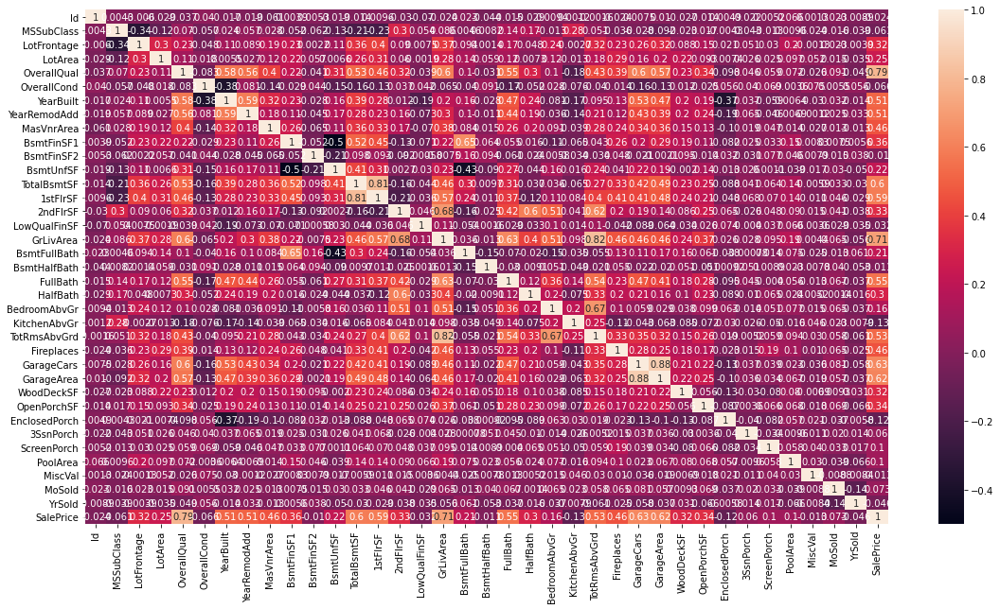

In [19]:
# Plotting correlation heatmap
plt.figure(figsize=[19,10],facecolor='white')
sns.heatmap(df_train.corr(),annot=True)

Observations: from the above plot we observe that SalesPrice is highly positively correlated with the columns OverallQual, YearBuilt, YearRemodAdd, TotalBsmtSF, 1stFlrSF, GrLivArea, FullBath, TotRmsAbvGrd, GarageCars, GarageArea.
whereas SalePrice is negatively correlated with OverallCond, KitchenAbvGr, Encloseporch, YrSold.
There is multicollinearity in between columns so we will be using Principal Component Analysis(PCA). No correlation has been observed between the column Id and other columns so we will be dropping this column.

In [20]:
# Checking the target Variable
df_train['SalePrice'].value_counts()

140000    18
135000    16
155000    12
160000    11
139000    11
145000    10
130000     9
110000     9
190000     9
125000     8
115000     8
147000     8
185000     8
127000     8
129000     8
215000     8
141000     7
175000     7
128000     7
235000     7
180000     7
165000     7
100000     7
230000     7
200000     7
176000     7
144000     7
170000     6
148000     6
205000     6
174000     6
108000     6
173000     6
132500     6
172500     5
124000     5
120000     5
151000     5
136500     5
158000     5
181000     5
187500     5
152000     5
157000     5
143000     5
239000     5
290000     5
260000     5
240000     5
225000     5
137000     5
133000     5
178000     5
250000     5
163000     4
189000     4
207500     4
120500     4
123000     4
192000     4
325000     4
112000     4
113000     4
150000     4
137500     4
118500     4
275000     4
124500     4
171000     4
119000     4
149900     4
132000     4
214000     4
184000     4
191000     4
127500     4
168000     4

<AxesSubplot:xlabel='SalePrice', ylabel='count'>

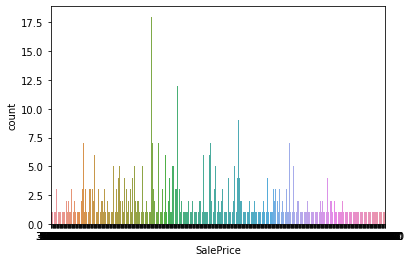

In [21]:
sns.countplot(df_train['SalePrice'])

we can observe that the maximum number of SalePrice lies between 140000 and 230000

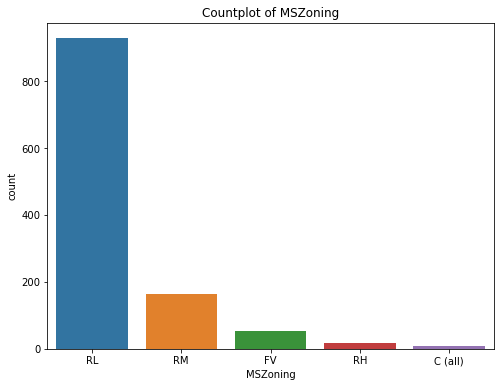

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64

In [22]:
# Let's check the column MsZoning

plt.subplots(figsize=(8,6))
sns.countplot(x="MSZoning", data=df_train)
plt.title("Countplot of MSZoning")
plt.xlabel('MSZoning')
plt.ylabel("count")
plt.show()

df_train['MSZoning'].value_counts()

here, we observe that the maximum(928)number of MSZoning are RL

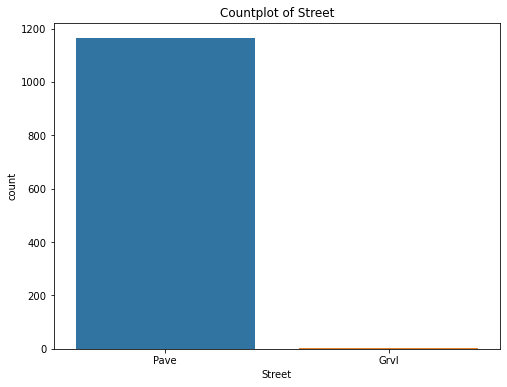

Pave    1164
Grvl       4
Name: Street, dtype: int64

In [23]:
# checking  the  value count of column Street

plt.subplots(figsize=(8,6))
sns.countplot(x="Street", data=df_train)
plt.title("Countplot of Street")
plt.xlabel('Street')
plt.ylabel("count")
plt.show()

df_train['Street'].value_counts()

the maximum number of Street are Pave i.e 1164 where as only 4 are Grvl.

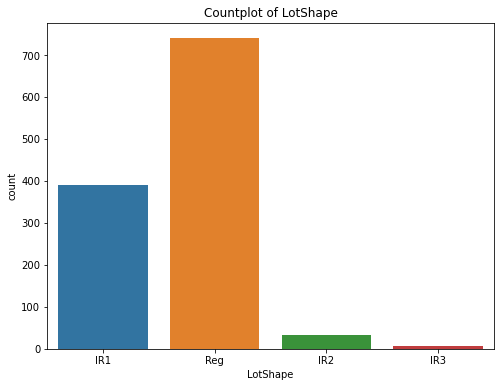

Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64

In [24]:
# checking the value counts of column LotShape

plt.subplots(figsize=(8,6))
sns.countplot(x="LotShape", data=df_train)
plt.title("Countplot of LotShape")
plt.xlabel('LotShape')
plt.ylabel("count")
plt.show()

df_train['LotShape'].value_counts()

we can say that the maximum number of LotShape are Reg i.e 740.

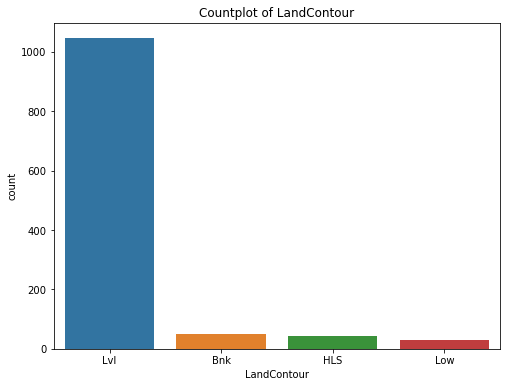

Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64

In [25]:
# checking the count plot of column LandContour

plt.subplots(figsize=(8,6))
sns.countplot(x="LandContour", data=df_train)
plt.title("Countplot of LandContour")
plt.xlabel('LandContour')
plt.ylabel("count")
plt.show()

df_train['LandContour'].value_counts()

we can observe that the maximum number of LandContour are Lvl i.e 1046.

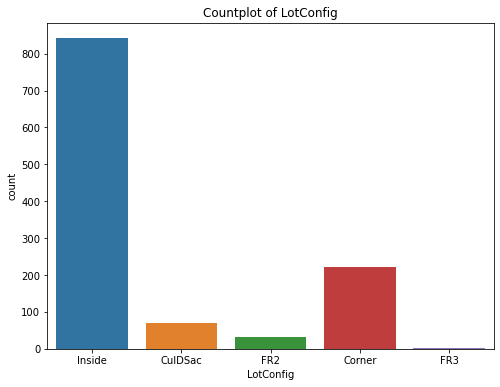

Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64

In [26]:
# checking the count plots of column LotConfig

plt.subplots(figsize=(8,6))
sns.countplot(x="LotConfig", data=df_train)
plt.title("Countplot of LotConfig")
plt.xlabel('LotConfig')
plt.ylabel("count")
plt.show()

df_train['LotConfig'].value_counts()

we can observe that the maximum number of LotConfig are Inside i.e 842.

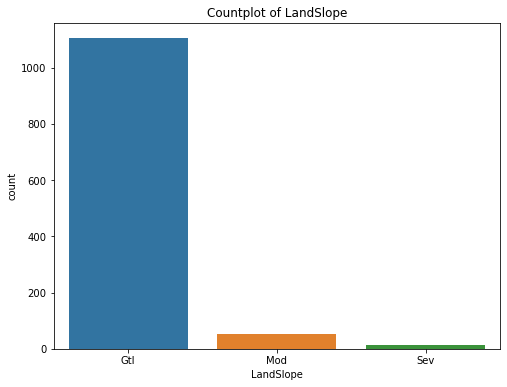

Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64

In [27]:
# checking  the count plot of column LandSlope

plt.subplots(figsize=(8,6))
sns.countplot(x="LandSlope", data=df_train)
plt.title("Countplot of LandSlope")
plt.xlabel('LandSlope')
plt.ylabel("count")
plt.show()

df_train['LandSlope'].value_counts()

we can say that the maximum number of LandSlope are Gtl 1105.

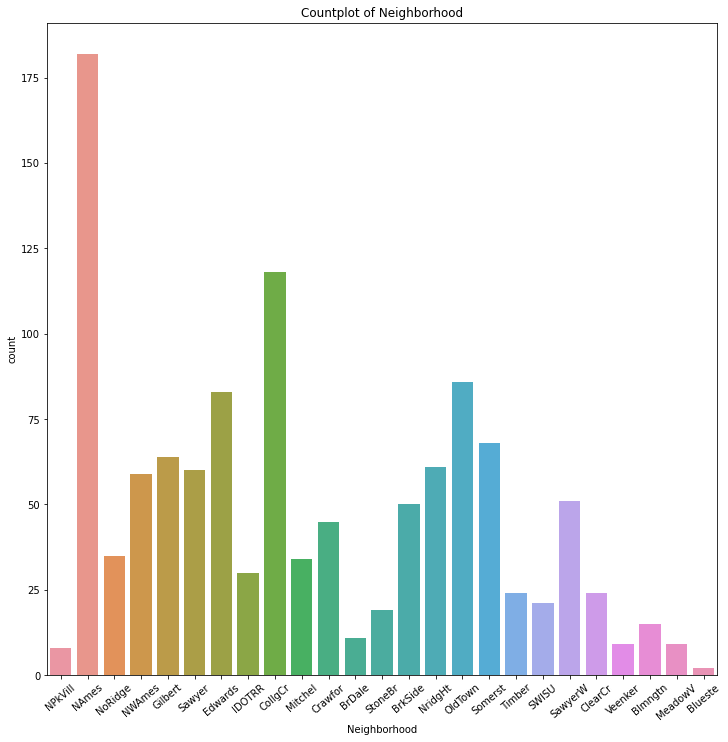

NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
ClearCr     24
Timber      24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64

In [28]:
#  checking the column Neighborhood

plt.subplots(figsize=(12,12))
sns.countplot(x="Neighborhood", data=df_train)
plt.title("Countplot of Neighborhood")
plt.xticks(rotation=40)
plt.xlabel('Neighborhood')
plt.ylabel("count")
plt.show()

df_train['Neighborhood'].value_counts()

we can say that the maximum number of Neighborhood are Names i.e 182.

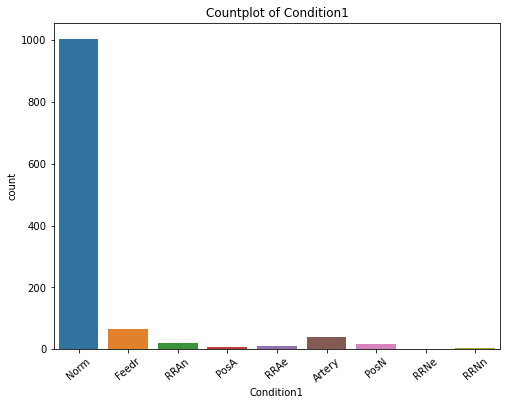

Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64

In [29]:
# checking  the column Condition1

plt.subplots(figsize=(8,6))
sns.countplot(x="Condition1", data=df_train)
plt.title("Countplot of Condition1")
plt.xticks(rotation=40)
plt.xlabel('Condition1')
plt.ylabel("count")
plt.show()

df_train['Condition1'].value_counts()

we can say that the maximum number of Condition1 is Norm i.e 1005.

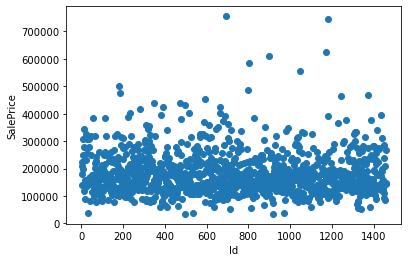

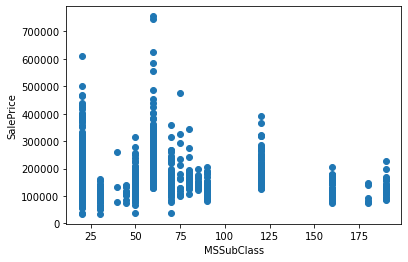

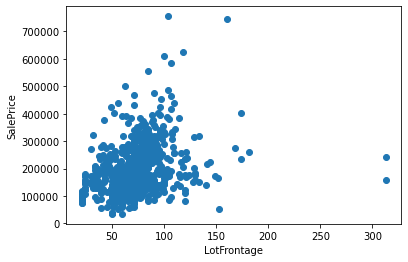

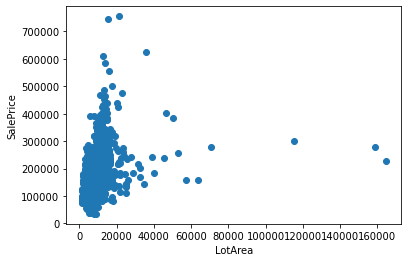

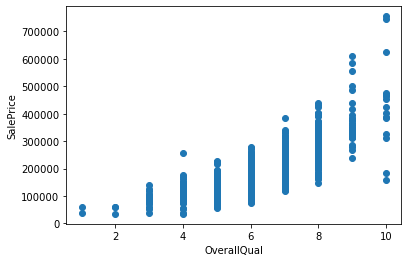

...

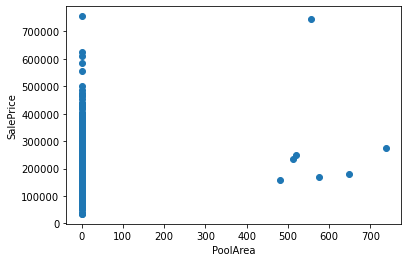

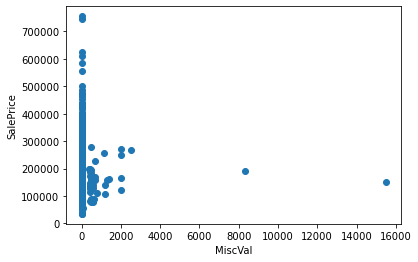

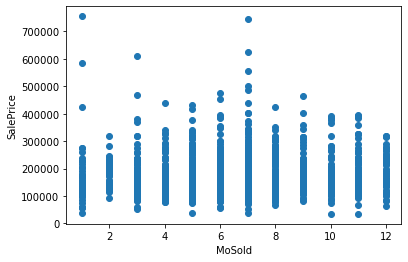

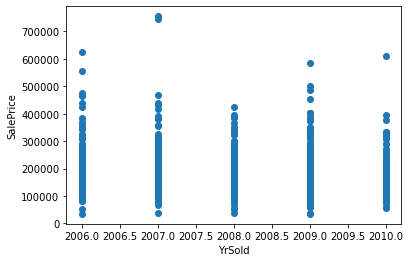

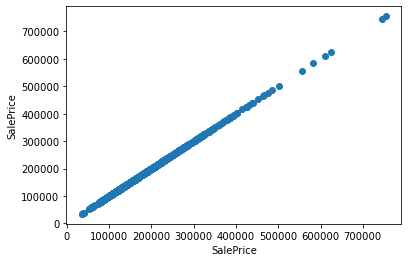

In [30]:
# plotting the Scatter plot between all feature variables and target variable

for col in df_train.describe().columns:
    df=df_train.copy()
    plt.scatter(df[col],df['SalePrice'])
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    plt.show()

we observe that SalePrice is maximum with FV MSZOning.

In [31]:
# Using Label Encoding to convert non numeric datato numeric data
LE = LabelEncoder()
for column in df_train.columns:
    df_train[column] = LE.fit_transform(df_train[column])

In [32]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,94,11,3,41,80,1,0,3,0,4,0,13,2,2,4,2,5,4,75,26,1,1,8,9,2,0,3,4,1,2,3,4,0,25,6,0,500,286,1,4,1,4,180,0,0,70,0,0,2,0,2,1,3,3,6,1,4,1,1,2,118,4,4,2,0,144,0,0,0,0,0,1,1,8,4,129
1,720,0,3,66,808,1,0,3,0,4,1,12,2,2,0,2,7,5,69,20,0,5,12,13,2,0,2,2,2,3,1,1,0,112,5,107,527,624,1,0,1,4,654,0,0,646,1,0,2,0,4,1,2,6,6,1,4,1,2,2,248,4,4,2,29,145,0,0,48,0,0,9,1,8,4,468
2,642,5,3,63,449,1,0,3,0,1,0,15,2,2,0,5,6,4,95,47,1,1,7,7,2,0,2,4,2,2,3,0,2,382,6,0,135,312,1,0,1,4,295,215,0,585,1,0,2,1,3,1,3,6,6,1,4,1,2,2,129,4,4,2,96,101,0,0,0,0,0,5,1,8,4,470
3,79,0,3,76,632,1,0,3,0,4,0,14,2,2,0,2,5,5,76,27,3,1,8,9,1,236,3,4,1,2,3,4,1,312,6,0,558,590,1,0,1,4,617,0,0,520,0,0,2,0,3,1,3,5,6,1,4,1,1,2,200,4,4,2,0,95,0,0,0,0,0,0,4,0,4,326
4,341,0,3,41,821,1,0,3,0,2,0,14,2,2,0,2,5,6,76,50,1,1,4,4,3,73,2,4,1,2,3,4,0,489,6,0,192,537,1,2,1,4,541,0,0,399,0,1,2,0,3,1,2,6,6,1,4,1,0,2,188,4,4,2,140,0,0,0,0,0,0,5,3,8,4,379


In [33]:
# Dropping ID COLUMN 
df_train.drop(['Id'],axis=1,inplace=True)
df_train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,11,3,41,80,1,0,3,0,4,0,13,2,2,4,2,5,4,75,26,1,1,8,9,2,0,3,4,1,2,3,4,0,25,6,0,500,286,1,4,1,4,180,0,0,70,0,0,2,0,2,1,3,3,6,1,4,1,1,2,118,4,4,2,0,144,0,0,0,0,0,1,1,8,4,129
1,0,3,66,808,1,0,3,0,4,1,12,2,2,0,2,7,5,69,20,0,5,12,13,2,0,2,2,2,3,1,1,0,112,5,107,527,624,1,0,1,4,654,0,0,646,1,0,2,0,4,1,2,6,6,1,4,1,2,2,248,4,4,2,29,145,0,0,48,0,0,9,1,8,4,468
2,5,3,63,449,1,0,3,0,1,0,15,2,2,0,5,6,4,95,47,1,1,7,7,2,0,2,4,2,2,3,0,2,382,6,0,135,312,1,0,1,4,295,215,0,585,1,0,2,1,3,1,3,6,6,1,4,1,2,2,129,4,4,2,96,101,0,0,0,0,0,5,1,8,4,470
3,0,3,76,632,1,0,3,0,4,0,14,2,2,0,2,5,5,76,27,3,1,8,9,1,236,3,4,1,2,3,4,1,312,6,0,558,590,1,0,1,4,617,0,0,520,0,0,2,0,3,1,3,5,6,1,4,1,1,2,200,4,4,2,0,95,0,0,0,0,0,0,4,0,4,326
4,0,3,41,821,1,0,3,0,2,0,14,2,2,0,2,5,6,76,50,1,1,4,4,3,73,2,4,1,2,3,4,0,489,6,0,192,537,1,2,1,4,541,0,0,399,0,1,2,0,3,1,2,6,6,1,4,1,0,2,188,4,4,2,140,0,0,0,0,0,0,5,3,8,4,379
5,5,3,28,766,1,0,3,0,4,0,8,2,2,0,5,6,4,105,56,1,1,11,12,2,0,2,4,2,2,3,0,6,0,6,0,470,171,1,0,1,4,129,254,0,528,0,0,2,1,4,1,2,7,6,1,2,3,0,3,265,4,4,2,40,8,0,0,0,0,0,10,0,6,5,385
6,0,3,41,600,1,0,3,0,4,0,19,2,2,0,2,4,5,56,46,3,1,12,13,1,112,3,4,1,2,3,4,0,501,6,0,29,455,1,4,1,4,448,0,0,289,1,0,1,1,3,1,3,3,4,1,2,5,2,2,187,4,4,2,0,0,0,0,7,0,0,4,4,8,4,112
7,0,3,59,722,1,3,3,0,0,0,19,2,2,0,2,4,3,56,50,1,1,12,13,0,31,3,4,1,3,3,4,5,37,1,99,148,321,1,0,1,4,609,0,0,508,1,0,2,0,3,1,3,6,0,1,4,1,1,2,154,4,4,2,0,0,0,0,0,0,0,0,0,8,4,220
8,0,3,40,362,1,3,3,0,0,0,7,1,2,0,2,4,6,64,15,3,1,7,7,2,0,3,4,1,3,3,4,0,308,2,11,237,364,1,0,1,4,351,0,0,190,1,0,1,0,2,1,3,4,6,0,2,5,2,2,134,1,1,2,0,0,63,0,0,0,3,3,1,8,4,175
9,4,3,51,277,1,3,3,0,4,0,12,2,2,0,0,4,4,46,0,1,1,7,7,2,0,3,4,1,3,3,4,5,167,6,0,215,144,1,4,1,4,102,24,0,191,0,0,1,0,2,1,3,4,6,0,2,5,2,1,61,4,4,2,78,0,28,0,0,0,0,9,2,0,0,101


In [34]:
# Checking the Statistical Summary
df_train.describe()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.0,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,4.166096,3.013699,40.920377,414.643836,0.996575,1.938356,2.773973,0.0,3.004281,0.064212,12.145548,2.032534,2.005993,0.476027,3.043664,5.104452,4.595890,70.619007,34.758562,1.402397,1.086473,8.659247,9.363014,1.758562,51.249144,2.530822,3.725171,1.395548,2.282534,2.802226,2.920377,3.161815,175.529966,5.581336,6.757705,285.619863,268.768836,1.035959,1.569349,0.933219,3.688356,296.392979,73.203767,0.190068,335.596747,0.425514,0.055651,1.562500,0.388699,2.883562,1.045377,2.328767,4.541952,5.742295,0.617295,2.389555,2.225171,1.233733,1.776541,154.196918,3.872432,3.905822,1.853596,49.506849,33.52226,7.361301,0.166952,2.630993,0.023973,0.299658,5.344178,1.804795,7.465753,3.768836,261.805651
std,4.139986,0.633120,18.812920,249.993254,0.058445,1.412262,0.710027,0.0,1.642667,0.284088,6.010364,0.871703,0.250035,1.180870,1.898625,1.390153,1.124343,28.853699,20.785185,0.832539,0.642848,3.097443,3.462380,0.611174,78.833040,0.699425,0.744463,0.709379,0.857830,0.674746,1.574648,2.252375,175.856891,1.203491,22.059754,200.425424,174.858561,0.302078,1.749129,0.249749,1.042606,185.215617,103.681502,1.576337,207.429163,0.521615,0.236699,0.551882,0.504929,0.812375,0.216292,0.832992,1.594749,0.987250,0.650575,0.905923,1.767017,0.809747,0.745554,105.049508,0.592724,0.503323,0.501894,65.624114,43.83520,20.842115,1.351138,10.103236,0.345529,1.834432,2.686352,1.329738,1.619459,1.112208,149.862407
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,3.000000,30.000000,197.750000,1.000000,0.000000,3.000000,0.0,2.000000,0.000000,7.000000,2.000000,2.000000,0.000000,2.000000,4.000000,4.000000,53.000000,16.000000,1.000000,1.000000,7.000000,7.000000,1.000000

In [35]:
df_int_types=[]
for i in df_train.columns:
    if df_train[i].dtypes == "int64" or "float64":
        df_int_types.append(i)

In [36]:
df_int_types

['MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Street',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',

In [37]:
# We will drop utilities column as it has only single type of value.
df_train.drop("Utilities", axis=1, inplace=True)

MSSubClass         AxesSubplot(0.125,0.816017;0.0824468x0.0639831)
MSZoning         AxesSubplot(0.223936,0.816017;0.0824468x0.0639...
LotFrontage      AxesSubplot(0.322872,0.816017;0.0824468x0.0639...
LotArea          AxesSubplot(0.421809,0.816017;0.0824468x0.0639...
Street           AxesSubplot(0.520745,0.816017;0.0824468x0.0639...
LotShape         AxesSubplot(0.619681,0.816017;0.0824468x0.0639...
LandContour      AxesSubplot(0.718617,0.816017;0.0824468x0.0639...
LotConfig        AxesSubplot(0.817553,0.816017;0.0824468x0.0639...
LandSlope          AxesSubplot(0.125,0.739237;0.0824468x0.0639831)
Neighborhood     AxesSubplot(0.223936,0.739237;0.0824468x0.0639...
Condition1       AxesSubplot(0.322872,0.739237;0.0824468x0.0639...
Condition2       AxesSubplot(0.421809,0.739237;0.0824468x0.0639...
BldgType         AxesSubplot(0.520745,0.739237;0.0824468x0.0639...
HouseStyle       AxesSubplot(0.619681,0.739237;0.0824468x0.0639...
OverallQual      AxesSubplot(0.718617,0.739237;0.0824468x0.063

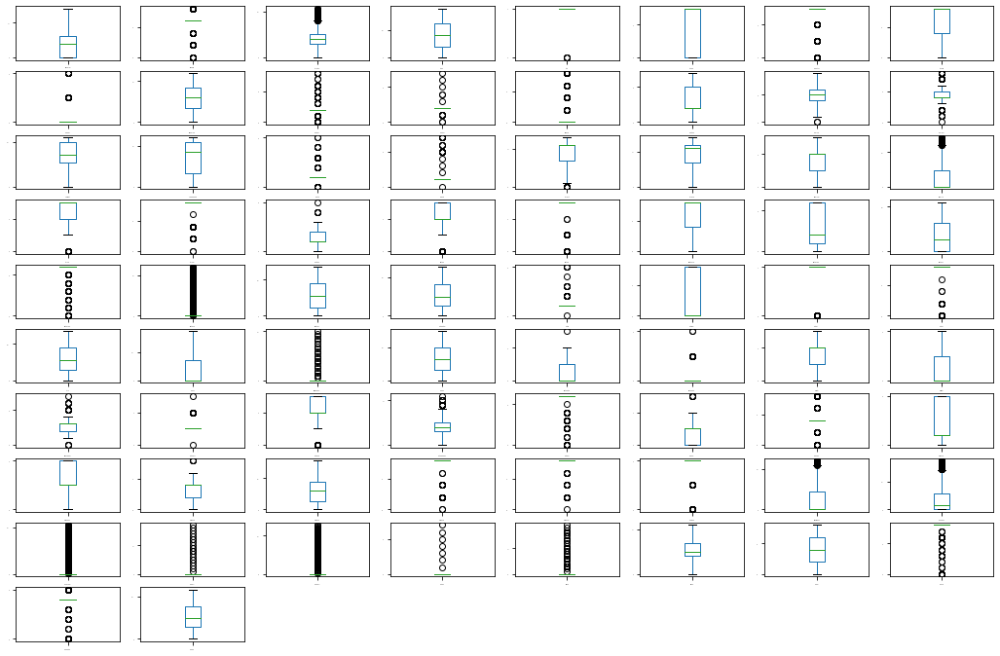

In [38]:
# Checking Outliers
df_train.plot(kind='box',subplots=True,layout=(10,8),sharex=False,fontsize=1,figsize=(18,12))

In [39]:
# Removing outliers
from scipy.stats import zscore
z=np.abs(zscore(df_train))
z

array([[1.65141417e+00, 2.16459851e-02, 4.23418559e-03, ...,
        3.30033286e-01, 2.07931875e-01, 8.86563491e-01],
       [1.00673783e+00, 2.16459851e-02, 1.33367740e+00, ...,
        3.30033286e-01, 2.07931875e-01, 1.37648045e+00],
       [2.01513080e-01, 2.16459851e-02, 1.17414422e+00, ...,
        3.30033286e-01, 2.07931875e-01, 1.38983174e+00],
       ...,
       [1.89306435e+00, 2.16459851e-02, 2.12287496e+00, ...,
        3.30033286e-01, 2.07931875e-01, 4.12592636e-01],
       [4.43163262e-01, 4.76211672e+00, 1.11249812e+00, ...,
        3.30033286e-01, 2.07931875e-01, 1.72101922e+00],
       [2.01513080e-01, 2.16459851e-02, 4.23418559e-03, ...,
        3.30033286e-01, 2.07931875e-01, 2.95025825e-01]])

In [40]:
threshold=3
print(np.where(z>3))

(array([   1,    1,    1, ..., 1166, 1166, 1166], dtype=int64), array([ 8, 19, 33, ..., 38, 60, 61], dtype=int64))


In [41]:
z[6][8]

0.22612631361962324

In [42]:
df_new=df_train[(z<3).all(axis=1)]
df_new

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,11,3,41,80,1,0,3,4,0,13,2,2,4,2,5,4,75,26,1,1,8,9,2,0,3,4,1,2,3,4,0,25,6,0,500,286,1,4,1,4,180,0,0,70,0,0,2,0,2,1,3,3,6,1,4,1,1,2,118,4,4,2,0,144,0,0,0,0,0,1,1,8,4,129
2,5,3,63,449,1,0,3,1,0,15,2,2,0,5,6,4,95,47,1,1,7,7,2,0,2,4,2,2,3,0,2,382,6,0,135,312,1,0,1,4,295,215,0,585,1,0,2,1,3,1,3,6,6,1,4,1,2,2,129,4,4,2,96,101,0,0,0,0,0,5,1,8,4,470
5,5,3,28,766,1,0,3,4,0,8,2,2,0,5,6,4,105,56,1,1,11,12,2,0,2,4,2,2,3,0,6,0,6,0,470,171,1,0,1,4,129,254,0,528,0,0,2,1,4,1,2,7,6,1,2,3,0,3,265,4,4,2,40,8,0,0,0,0,0,10,0,6,5,385
6,0,3,41,600,1,0,3,4,0,19,2,2,0,2,4,5,56,46,3,1,12,13,1,112,3,4,1,2,3,4,0,501,6,0,29,455,1,4,1,4,448,0,0,289,1,0,1,1,3,1,3,3,4,1,2,5,2,2,187,4,4,2,0,0,0,0,7,0,0,4,4,8,4,112
11,5,3,14,411,1,0,3,1,0,5,2,2,0,5,6,5,102,53,1,1,11,12,1,133,2,4,2,2,3,4,2,185,6,0,261,204,1,0,1,4,169,217,0,516,1,0,2,1,3,1,2,5,6,1,4,1,1,2,241,4,4,2,106,27,0,0,0,0,0,0,4,8,4,418
12,0,3,93,366,1,0,3,4,0,11,2,2,0,2,6,4,102,53,1,1,11,12,2,0,2,4,2,0,3,4,6,0,6,0,643,519,1,0,1,4,525,0,0,378,0,0,2,0,3,1,2,5,6,0,2,1,0,2,216,4,4,2,40,115,0,0,0,0,0,3,4,8,4,351
16,1,4,41,108,1,3,3,0,0,9,2,2,0,2,5,7,32,57,1,1,12,13,2,0,2,2,0,3,3,0,0,216,6,0,144,136,1,0,1,4,94,0,0,25,0,0,1,0,2,1,3,3,6,0,2,5,2,1,111,4,4,2,0,0,24,0,0,0,0,5,2,8,4,110
17,0,3,34,176,1,3,3,4,0,5,2,2,0,2,6,4,106,57,1,1,11,12,3,40,2,4,2,2,3,0,2,320,6,0,292,373,1,0,1,4,364,0,0,203,1,0,2,0,2,1,2,4,6,0,2,1,1,2,256,4,4,2,60,0,0,0,0,0,0,1,3,8,4,335
19,12,4,1,11,1,3,3,4,0,2,2,2,4,5,4,4,69,20,1,1,5,5,1,182,3,4,1,3,3,4,6,0,6,0,353,49,1,4,1,4,22,116,0,241,0,0,2,1,3,1,3,4,6,0,2,5,2,2,118,4,4,2,0,0,0,0,0,0,0,3,1,8,4,69
21,9,3,40,271,1,3,3,0,0,5,2,2,0,6,4,6,71,57,1,1,5,14,2,0,3,4,1,2,3,0,2,285,6,0,42,106,1,4,1,4,65,0,0,15,1,0,1,0,2,1,3,3,6,0,2,5,2,2,85,4,4,2,19,0,0,0,0,0,0,2,3,8,4,145


In [43]:
df_new.shape

(490, 74)

In [44]:
# Checking the percentage of loss data
loss_percent =(269-234)/269*100
print(loss_percent)

13.011152416356877


In [45]:
#checking Skewness after removing Outliers
df_new.skew()

MSSubClass        0.656872
MSZoning          2.413607
LotFrontage       0.217429
LotArea           0.114443
Street            0.000000
LotShape         -0.353679
LandContour      -4.939000
LotConfig        -1.049350
LandSlope         0.000000
Neighborhood      0.138264
Condition1       -0.327357
Condition2        0.000000
BldgType          2.180485
HouseStyle        0.318601
OverallQual      -0.056123
OverallCond       1.147211
YearBuilt        -0.870534
YearRemodAdd     -0.864278
RoofStyle         1.586973
RoofMatl          0.000000
Exterior1st      -0.668636
Exterior2nd      -0.655662
MasVnrType        0.377798
MasVnrArea        1.085915
ExterQual        -0.105345
ExterCond        -3.016322
Foundation       -0.693773
BsmtQual         -1.293259
BsmtCond         -4.297276
BsmtExposure     -0.782866
BsmtFinType1      0.321093
BsmtFinSF1        0.266194
BsmtFinType2     -4.581344
BsmtFinSF2        5.166811
BsmtUnfSF         0.261643
TotalBsmtSF       0.227739
Heating           0.000000
H

In [46]:
# Removing skewness
df_sk=['MSSubClass','MSZoning','BldgType','OverallCond','RoofStyle','MasVnrArea','BsmtFinSF2','BsmtUnfSF','HeatingQC','2ndFlrSF',
      'LowQualFinSF','FireplaceQu','GarageType','WoodDeckSF','OpenPorchSF','EnclosedPorch','ScreenPorch','MiscVal','SaleCondition']
for val in df_sk:
    if df_new.skew().loc[val]>0.55:
        df_new[val]=np.sqrt(df_new[val])

In [47]:
df_new.skew()

MSSubClass        0.015208
MSZoning          2.235064
LotFrontage       0.217429
LotArea           0.114443
Street            0.000000
LotShape         -0.353679
LandContour      -4.939000
LotConfig        -1.049350
LandSlope         0.000000
Neighborhood      0.138264
Condition1       -0.327357
Condition2        0.000000
BldgType          2.099750
HouseStyle        0.318601
OverallQual      -0.056123
OverallCond       0.862495
YearBuilt        -0.870534
YearRemodAdd     -0.864278
RoofStyle         1.586973
RoofMatl          0.000000
Exterior1st      -0.668636
Exterior2nd      -0.655662
MasVnrType        0.377798
MasVnrArea        0.488864
ExterQual        -0.105345
ExterCond        -3.016322
Foundation       -0.693773
BsmtQual         -1.293259
BsmtCond         -4.297276
BsmtExposure     -0.782866
BsmtFinType1      0.321093
BsmtFinSF1        0.266194
BsmtFinType2     -4.581344
BsmtFinSF2        4.565087
BsmtUnfSF         0.261643
TotalBsmtSF       0.227739
Heating           0.000000
H

In [48]:
df_sk=['MSSubClass','MSZoning','BldgType','OverallCond','RoofStyle','MasVnrArea','BsmtFinSF2','BsmtUnfSF','HeatingQC','2ndFlrSF',
      'LowQualFinSF','FireplaceQu','GarageType','WoodDeckSF','OpenPorchSF','EnclosedPorch','ScreenPorch','MiscVal','SaleCondition']
for val in df_sk:
    if df_new.skew().loc[val]>0.55:
        df_new[val]=np.sqrt(df_new[val])

In [49]:
# Rechecking Skewness
df_new.skew()

MSSubClass        0.015208
MSZoning          2.116107
LotFrontage       0.217429
LotArea           0.114443
Street            0.000000
LotShape         -0.353679
LandContour      -4.939000
LotConfig        -1.049350
LandSlope         0.000000
Neighborhood      0.138264
Condition1       -0.327357
Condition2        0.000000
BldgType          2.064816
HouseStyle        0.318601
OverallQual      -0.056123
OverallCond       0.678973
YearBuilt        -0.870534
YearRemodAdd     -0.864278
RoofStyle         1.586973
RoofMatl          0.000000
Exterior1st      -0.668636
Exterior2nd      -0.655662
MasVnrType        0.377798
MasVnrArea        0.488864
ExterQual        -0.105345
ExterCond        -3.016322
Foundation       -0.693773
BsmtQual         -1.293259
BsmtCond         -4.297276
BsmtExposure     -0.782866
BsmtFinType1      0.321093
BsmtFinSF1        0.266194
BsmtFinType2     -4.581344
BsmtFinSF2        4.320339
BsmtUnfSF         0.261643
TotalBsmtSF       0.227739
Heating           0.000000
H

In [50]:
df_sk=['MSSubClass','MSZoning','BldgType','OverallCond','RoofStyle','MasVnrArea','BsmtFinSF2','BsmtUnfSF','HeatingQC','2ndFlrSF',
      'LowQualFinSF','FireplaceQu','GarageType','WoodDeckSF','OpenPorchSF','EnclosedPorch','ScreenPorch','MiscVal','SaleCondition']
for val in df_sk:
    if df_new.skew().loc[val]>0.55:
        df_new[val]=np.sqrt(df_new[val])

In [51]:
df_new.skew()

MSSubClass        0.015208
MSZoning          2.047471
LotFrontage       0.217429
LotArea           0.114443
Street            0.000000
LotShape         -0.353679
LandContour      -4.939000
LotConfig        -1.049350
LandSlope         0.000000
Neighborhood      0.138264
Condition1       -0.327357
Condition2        0.000000
BldgType          2.052571
HouseStyle        0.318601
OverallQual      -0.056123
OverallCond       0.573011
YearBuilt        -0.870534
YearRemodAdd     -0.864278
RoofStyle         1.586973
RoofMatl          0.000000
Exterior1st      -0.668636
Exterior2nd      -0.655662
MasVnrType        0.377798
MasVnrArea        0.488864
ExterQual        -0.105345
ExterCond        -3.016322
Foundation       -0.693773
BsmtQual         -1.293259
BsmtCond         -4.297276
BsmtExposure     -0.782866
BsmtFinType1      0.321093
BsmtFinSF1        0.266194
BsmtFinType2     -4.581344
BsmtFinSF2        4.231212
BsmtUnfSF         0.261643
TotalBsmtSF       0.227739
Heating           0.000000
H

In [52]:
df_sk=['MSSubClass','MSZoning','BldgType','OverallCond','RoofStyle','MasVnrArea','BsmtFinSF2','BsmtUnfSF','HeatingQC','2ndFlrSF',
      'LowQualFinSF','FireplaceQu','GarageType','WoodDeckSF','OpenPorchSF','EnclosedPorch','ScreenPorch','MiscVal','SaleCondition']
for val in df_sk:
    if df_new.skew().loc[val]>0.55:
        df_new[val]=np.sqrt(df_new[val])

In [53]:
df_new.skew()

MSSubClass        0.015208
MSZoning          2.010615
LotFrontage       0.217429
LotArea           0.114443
Street            0.000000
LotShape         -0.353679
LandContour      -4.939000
LotConfig        -1.049350
LandSlope         0.000000
Neighborhood      0.138264
Condition1       -0.327357
Condition2        0.000000
BldgType          2.048887
HouseStyle        0.318601
OverallQual      -0.056123
OverallCond       0.515888
YearBuilt        -0.870534
YearRemodAdd     -0.864278
RoofStyle         1.586973
RoofMatl          0.000000
Exterior1st      -0.668636
Exterior2nd      -0.655662
MasVnrType        0.377798
MasVnrArea        0.488864
ExterQual        -0.105345
ExterCond        -3.016322
Foundation       -0.693773
BsmtQual         -1.293259
BsmtCond         -4.297276
BsmtExposure     -0.782866
BsmtFinType1      0.321093
BsmtFinSF1        0.266194
BsmtFinType2     -4.581344
BsmtFinSF2        4.203145
BsmtUnfSF         0.261643
TotalBsmtSF       0.227739
Heating           0.000000
H

In [54]:
df_sk=['MSZoning','BldgType','OverallCond','RoofStyle','BsmtFinSF2',
      'LowQualFinSF','FireplaceQu','GarageType','EnclosedPorch','ScreenPorch','MiscVal','SaleCondition']
for val in df_sk:
    if df_new.skew().loc[val]>0.55:
        df_new[val]=np.sqrt(df_new[val])

In [55]:
df_new.skew()

MSSubClass        0.015208
MSZoning          1.991519
LotFrontage       0.217429
LotArea           0.114443
Street            0.000000
LotShape         -0.353679
LandContour      -4.939000
LotConfig        -1.049350
LandSlope         0.000000
Neighborhood      0.138264
Condition1       -0.327357
Condition2        0.000000
BldgType          2.047872
HouseStyle        0.318601
OverallQual      -0.056123
OverallCond       0.515888
YearBuilt        -0.870534
YearRemodAdd     -0.864278
RoofStyle         1.586973
RoofMatl          0.000000
Exterior1st      -0.668636
Exterior2nd      -0.655662
MasVnrType        0.377798
MasVnrArea        0.488864
ExterQual        -0.105345
ExterCond        -3.016322
Foundation       -0.693773
BsmtQual         -1.293259
BsmtCond         -4.297276
BsmtExposure     -0.782866
BsmtFinType1      0.321093
BsmtFinSF1        0.266194
BsmtFinType2     -4.581344
BsmtFinSF2        4.195193
BsmtUnfSF         0.261643
TotalBsmtSF       0.227739
Heating           0.000000
H

In [56]:
df_ls=['LandContour','LotConfig','Condition1','YearBuilt','YearRemodAdd','Exterior1st','Exterior2nd','ExterCond','Foundation',
     'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType2','SaleType','PavedDrive','FireplaceQu','Functional',
       'KitchenQual','Electrical']
for val in df_ls:
    if df_new.skew().loc[val]<-0.55:
        df_new[val]=np.cbrt(df_new[val])

In [57]:
df_new.skew()

MSSubClass        0.015208
MSZoning          1.991519
LotFrontage       0.217429
LotArea           0.114443
Street            0.000000
LotShape         -0.353679
LandContour      -4.980075
LotConfig        -1.353121
LandSlope         0.000000
Neighborhood      0.138264
Condition1       -0.327357
Condition2        0.000000
BldgType          2.047872
HouseStyle        0.318601
OverallQual      -0.056123
OverallCond       0.515888
YearBuilt        -1.531210
YearRemodAdd     -2.209955
RoofStyle         1.586973
RoofMatl          0.000000
Exterior1st      -2.533563
Exterior2nd      -2.249007
MasVnrType        0.377798
MasVnrArea        0.488864
ExterQual        -0.105345
ExterCond        -3.016322
Foundation       -3.278794
BsmtQual         -2.891384
BsmtCond         -4.297276
BsmtExposure     -1.197389
BsmtFinType1      0.321093
BsmtFinSF1        0.266194
BsmtFinType2     -4.700500
BsmtFinSF2        4.195193
BsmtUnfSF         0.261643
TotalBsmtSF       0.227739
Heating           0.000000
H

In [58]:
df_new.drop(['PavedDrive','LowQualFinSF', 'Electrical', 'Exterior2nd', 'Exterior1st'], axis=1,inplace=True)

In [59]:
x=df_new[['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SaleType', 'SaleCondition']]

y=df_new['SalePrice']

In [60]:
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,3.316625,1.034928,41,80,1,0,1.44225,1.587401,0,13,2,2,1.044274,2,5,1.090508,4.217163,2.962496,1.000000,1,2,0.000000,3,1.587401,1.000000,1.259921,1.44225,1.587401,0,25,1.817121,0.0,500,286,1,2.0,1,180,0.000000,70,0,0,2,0,2,1,1.442250,3,1.817121,1,1.259921,1.000000,1,2,118,4,4,0.000000,12.000000,0.0,0,0.000000,0,0.0,1,1,2.000000,1.044274
2,2.236068,1.034928,63,449,1,0,1.44225,1.000000,0,15,2,2,0.000000,5,6,1.090508,4.562903,3.608826,1.000000,1,2,0.000000,2,1.587401,1.259921,1.259921,1.44225,0.000000,2,382,1.817121,0.0,135,312,1,0.0,1,295,3.829214,585,1,0,2,1,3,1,1.442250,6,1.817121,1,1.259921,1.000000,2,2,129,4,4,9.797959,10.049876,0.0,0,0.000000,0,0.0,5,1,2.000000,1.044274
5,2.236068,1.034928,28,766,1,0,1.44225,1.587401,0,8,2,2,0.000000,5,6,1.090508,4.717694,3.825862,1.000000,1,2,0.000000,2,1.587401,1.259921,1.259921,1.44225,0.000000,6,0,1.817121,0.0,470,171,1,0.0,1,129,3.992165,528,0,0,2,1,4,1,1.259921,7,1.817121,1,1.122462,1.034928,0,3,265,4,4,6.324555,2.828427,0.0,0,0.000000,0,0.0,10,0,1.817121,1.051581
6,0.000000,1.034928,41,600,1,0,1.44225,1.587401,0,19,2,2,0.000000,2,4,1.105823,3.825862,3.583048,1.034928,1,1,10.583005,3,1.587401,1.000000,1.259921,1.44225,1.587401,0,501,1.817121,0.0,29,455,1,2.0,1,448,0.000000,289,1,0,1,1,3,1,1.442250,3,1.587401,1,1.122462,1.051581,2,2,187,4,4,0.000000,0.000000,0.0,0,1.062697,0,0.0,4,4,2.000000,1.044274
11,2.236068,1.034928,14,411,1,0,1.44225,1.000000,0,5,2,2,0.000000,5,6,1.105823,4.672329,3.756286,1.000000,1,1,11.532563,2,1.587401,1.259921,1.259921,1.44225,1.587401,2,185,1.817121,0.0,261,204,1,0.0,1,169,3.838088,516,1,0,2,1,3,1,1.259921,5,1.817121,1,1.259921,1.000000,1,2,241,4,4,10.295630,5.196152,0.0,0,0.000000,0,0.0,0,4,2.000000,1.044274


In [61]:
# Scaling the data
from sklearn.preprocessing import StandardScaler
SC=StandardScaler()
x=SC.fit_transform(x)


In [62]:
x

array([[ 1.39370734, -0.28757999, -0.05104417, ..., -0.63882369,
         0.34314498, -0.26791393],
       [ 0.58084861, -0.28757999,  1.12471674, ..., -0.63882369,
         0.34314498, -0.26791393],
       [ 0.58084861, -0.28757999, -0.74581197, ..., -1.36678556,
        -2.05040335,  2.52243131],
       ...,
       [-1.10125393, -0.28757999, -0.05104417, ...,  1.54506194,
         0.34314498, -0.26791393],
       [ 1.50464812, -0.28757999, -2.18879126, ...,  0.81710006,
         0.34314498, -0.26791393],
       [ 0.58084861, -0.28757999, -0.05104417, ..., -1.36678556,
         0.34314498, -0.26791393]])

In [63]:
x=pd.DataFrame(x)

In [64]:
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67
0,1.393707,-0.287580,-0.051044,-1.331187,0.0,-1.205379,0.197093,0.576135,0.0,0.218875,0.076923,0.0,2.461368,-0.710363,-0.257949,-0.531903,-0.179260,-0.294164,-0.484001,0.0,0.461222,-0.900755,0.963982,0.302182,-0.556172,0.090094,0.221925,0.641189,-1.317207,-0.974445,0.223238,-0.226893,0.998296,-0.004177,0.0,1.462261,0.0,-0.658166,-0.796660,-1.264809,-0.913896,0.0,0.703840,-0.841021,-1.213086,0.0,0.561465,-1.022212,0.134677,0.609697,0.799511,-0.566767,-0.030904,0.126656,-0.484952,0.0,0.0,-1.051807,2.010295,-0.281528,0.0,-0.206244,0.0,-0.101535,-1.651614,-0.638824,0.343145,-0.267914
1,0.580849,-0.287580,1.124717,0.198667,0.0,-1.205379,0.197093,-0.360821,0.0,0.541914,0.076923,0.0,-0.408231,0.960410,0.536989,-0.531903,0.544832,0.419832,-0.484001,0.0,0.461222,-0.900755,-1.020686,0.302182,0.568837,0.090094,0.221925,-1.850658,-0.423258,1.064912,0.223238,-0.226893,-0.808074,0.155638,0.0,-0.798610,0.0,-0.006213,1.342064,1.272712,1.094216,0.0,0.703840,1.189030,0.233172,0.0,0.561465,1.100178,0.134677,0.609697,0.799511,-0.566767,1.231011,0.126656,-0.376577,0.0,0.0,0.830885,1.508978,-0.281528,0.0,-0.206244,0.0,-0.101535,-0.097527,-0.638824,0.343145,-0.267914
2,0.580849,-0.287580,-0.745812,1.512931,0.0,-1.205379,0.197093,0.576135,0.0,-0.588722,0.076923,0.0,-0.408231,0.960410,0.536989,-0.531903,0.869016,0.659590,-0.484001,0.0,0.461222,-0.900755,-1.020686,0.302182,0.568837,0.090094,0.221925,-1.850658,1.364641,-1.117257,0.223238,-0.226893,0.849827,-0.711053,0.0,-0.798610,0.0,-0.947293,1.433077,0.991860,-0.913896,0.0,0.703840,1.189030,1.679431,0.0,-0.020252,1.807641,0.134677,0.609697,-0.108847,1.176314,-1.292819,1.569951,0.963330,0.0,0.0,0.163466,-0.347435,-0.281528,0.0,-0.206244,0.0,-0.101535,1.845082,-1.366786,-2.050403,2.522431
3,-1.101254,-0.287580,-0.051044,0.824705,0.0,-1.205379,0.197093,0.576135,0.0,1.187992,0.076923,0.0,-0.408231,-0.710363,-1.052888,0.680807,-0.998773,0.391355,2.066112,0.0,-1.086716,0.953536,0.963982,0.302182,-0.556172,0.090094,0.221925,0.641189,-1.317207,1.744697,0.223238,-0.226893,-1.332664,1.034622,0.0,1.462261,0.0,0.861168,-0.796660,-0.185746,1.094216,0.0,-1.244643,1.189030,0.233172,0.0,0.561465,-1.022212,-4.781613,0.609697,-0.108847,2.007409,1.231011,0.126656,0.194854,0.0,0.0,-1.051807,-1.074536,-0.281528,0.0,4.723788,0.0,-0.101535,-0.486049,1.545062,0.343145,-0.267914
4,0.580849,-0.287580,-1.494023,0.041121,0.0,-1.205379,0.197093,-0.360821,0.0,-1.073280,0.076923,0.0,-0.408231,0.960410,0.536989,0.680807,0.774006,0.582729,-0.484001,0.0,-1.086716,1.119911,-1.020686,0.302182,0.568837,0.090094,0.221925,0.641189,-0.423258,-0.060447,0.223238,-0.226893,-0.184505,-0.508210,0.0,-0.798610,0.0,-0.720527,1.347021,0.932734,1.094216,0.0,0.703840,1.189030,0.233172,0.0,-0.020252,0.392714,0.134677,0.609697,0.799511,-0.566767,-0.030904,0.126656,0.726876,0.0,0.0,0.926514,0.261235,-0.281528,0.0,-0.206244,0.0,-0.101535,-2.040136,1.545062,0.343145,-0.267914
5,-1.101254,-0.287580,2.728027,-0.145447,0.0,-1.205379,0.197093,0.576135,0.0,-0.104164,0.076923,0.0,-0.408231,-0.710363,0.536989,-0.531903,0.774006,0.582729,-0.484001,0.0,0.461222,-0.900755,-1.020686,0.302182,0.568837,-3.395177,0.221925,0.641189,1.364641,-1.117257,0.223238,-0.226893,1.705998,1.428013,0.0,-0.798610,0.0,1.297694,-0.796660,0.252777,-0.913896,0.0,0.703840,-0.841021,0.233172,0.0,-0.020252,0.392714,0.134677,-1.050033,-0.108847,-0.566767,-1.292819,0.126656,0.480569,0.0,0.0,0.163466,1.682225,-0.281528,0.0,-0.206244,0.0,-0.101535,-0.874571,1.545062,0.343145,-0.267914
6,-0.348995,2.973454,-0.051044,-1.215100,0.0,0.845439,0.197093,-1.955908,0.0,-0.427202,0.076923,0.0,-0.408231,-0.710363,-0.257949,2.541700,-2.362306,0.684599,-0.484001,0.0,0.461222,-0.900755,-1.020686,-3.309263,-4.884446,0.594462,0.221925,-1.850658,-1.317207,0.116640,0.223238,-0.226893,-0.763534,-0.926189,0.0,-0.798610,0.0

In [65]:
# PCA
# Importing and fitting data to pca
from sklearn.decomposition import PCA

pca =PCA(n_components=65)
pca.fit(x)

PCA(n_components=65)

In [66]:
pca.explained_variance_ratio_

array([1.78843244e-01, 7.72501498e-02, 6.73717578e-02, 5.86791678e-02,
       3.53997805e-02, 3.28175474e-02, 3.17513807e-02, 2.81995641e-02,
       2.55983013e-02, 2.34216786e-02, 2.29305558e-02, 2.21073192e-02,
       2.10635799e-02, 2.05420653e-02, 1.98814398e-02, 1.90481053e-02,
       1.81986657e-02, 1.63198172e-02, 1.61454812e-02, 1.52841927e-02,
       1.42021279e-02, 1.40684623e-02, 1.35941286e-02, 1.31181255e-02,
       1.26736088e-02, 1.23375765e-02, 1.16851079e-02, 1.10770623e-02,
       1.07546564e-02, 1.05863688e-02, 9.64121946e-03, 9.30431674e-03,
       9.12832024e-03, 8.78698956e-03, 8.16709849e-03, 7.63938742e-03,
       7.43274669e-03, 7.19943409e-03, 6.56752031e-03, 6.43274812e-03,
       5.25873259e-03, 4.95123758e-03, 4.70363685e-03, 4.65497713e-03,
       4.07656243e-03, 3.78755623e-03, 3.16588777e-03, 3.05230180e-03,
       2.33040846e-03, 2.27057683e-03, 1.85350501e-03, 1.67744193e-03,
       1.33109273e-03, 1.09889217e-03, 3.15273831e-04, 2.21115886e-04,
      

In [67]:
x_returned_pca=pca.transform(x)

In [68]:
x_returned_pca.shape

(490, 65)

In [69]:
# Important feature using ExtraTreesRegressor

from sklearn.ensemble import ExtraTreesRegressor
selection = ExtraTreesRegressor()
selection.fit(x,y)

ExtraTreesRegressor()

In [70]:
print(selection.feature_importances_)

[3.26062797e-03 2.38928177e-03 4.08746976e-03 7.25418939e-03
 0.00000000e+00 2.03120312e-03 1.10230672e-03 1.73753990e-03
 0.00000000e+00 3.07671492e-03 1.26554930e-03 0.00000000e+00
 4.87289626e-03 2.92385214e-03 1.32030589e-01 4.06092069e-03
 7.02925960e-03 4.52608110e-03 1.69902377e-03 0.00000000e+00
 3.40430890e-03 4.07595004e-03 6.99415856e-02 3.98649385e-04
 5.89409172e-03 1.74187155e-02 1.33443265e-03 2.15479652e-03
 1.86128792e-03 1.29264705e-02 3.35408312e-04 2.55428072e-04
 2.66994078e-03 1.98719143e-02 0.00000000e+00 2.36737864e-03
 0.00000000e+00 2.45064801e-02 3.77809148e-03 1.62746533e-01
 1.14390697e-02 0.00000000e+00 3.20017183e-01 3.20460247e-03
 7.56028535e-03 0.00000000e+00 7.37107392e-03 9.53013493e-03
 1.80563611e-03 4.13965687e-03 1.28072891e-03 4.94253163e-03
 3.16750000e-03 5.17764808e-02 3.31447935e-02 0.00000000e+00
 0.00000000e+00 4.21363784e-03 7.17397222e-03 7.66732222e-04
 0.00000000e+00 6.18311643e-04 0.00000000e+00 1.24010334e-04
 3.19070868e-03 2.200148

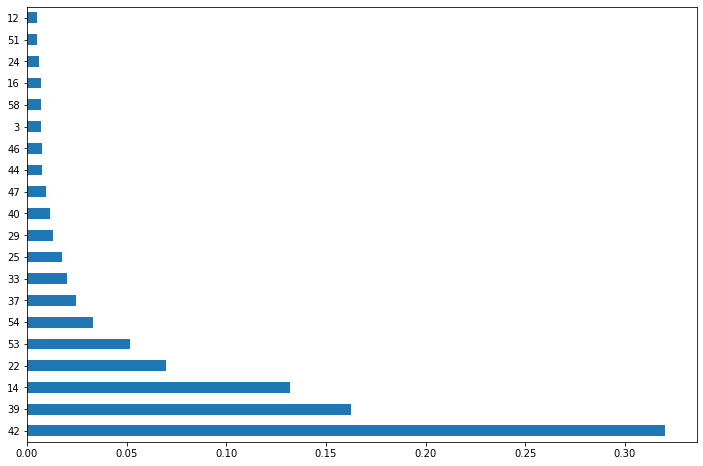

In [71]:
# Plotting graph  for feature importance
plt.figure(figsize = (12,8))
feat_imp = pd.Series(selection.feature_importances_ , index= x.columns)
feat_imp.nlargest(20).plot(kind ='barh')
plt.show()

In [72]:
#splitting the  data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [73]:
from sklearn.linear_model import LinearRegression

lr=LinearRegression()
lr.fit(x_train,y_train)
print(lr.score(x_train,y_train))
lr_predict=lr.predict(x_test)

0.9415861433978303


In [74]:
from sklearn.metrics import mean_absolute_error
print('MSE:',mean_squared_error(lr_predict,y_test))
print('MAE:',mean_absolute_error(lr_predict,y_test))
print('r2_score:',r2_score(lr_predict,y_test))

MSE: 836.1881221043686
MAE: 23.399160116091934
r2_score: 0.9506469042675431


In [75]:
# Using SGD regressor
from sklearn.linear_model import SGDRegressor
from sklearn import metrics
sgd=SGDRegressor()
sgd.fit(x_train,y_train)
pred=sgd.predict(x_test)
print('R2_score:',r2_score(y_test,pred))
print('MSE:',metrics.mean_squared_error(y_test,pred))
print('MAE:',metrics.mean_absolute_error(y_test,pred))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.955279117299597
MSE: 875.6734436268313
MAE: 23.916090515521987
RMSE: 29.59178000098729


In [76]:
# Using LASSO
from sklearn.linear_model import Lasso,Ridge
parameters={'alpha':[0.0001,0.001,0.01,0.1,1,10],'random_state':list(range(0,100))}
ls=Lasso()
Z=GridSearchCV(ls,parameters)
Z.fit(x_train,y_train)
print(Z.best_params_)

{'alpha': 1, 'random_state': 0}


In [77]:
ls=Lasso(alpha=1,random_state=0)
ls.fit(x_train,y_train)
pred=ls.predict(x_test)
print('R2_score:',r2_score(y_test,pred))
print('MSE:',metrics.mean_squared_error(y_test,pred))
print('MAE:',metrics.mean_absolute_error(y_test,pred))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.9576780448362539
MSE: 828.7003739960622
MAE: 23.211610834353923
RMSE: 28.78715640691283


In [78]:
# Using RIDGE
parameters={'alpha':[0.001,0.01,0.1,1,10],'solver':['auto','svd','cholesky','lsqr','sparse_cg','sag','saga']}
rd=Ridge()
Z1=GridSearchCV(rd,parameters)
Z1.fit(x_train,y_train)
print(Z1.best_params_)

{'alpha': 1, 'solver': 'sparse_cg'}


In [79]:
rd=Ridge(alpha=10,solver='lsqr')
rd.fit(x_train,y_train)
pred=rd.predict(x_test)
print('R2_score:',r2_score(y_test,pred))
print('MSE:',metrics.mean_squared_error(y_test,pred))
print('MAE:',metrics.mean_absolute_error(y_test,pred))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.9556656826077627
MSE: 868.104161578981
MAE: 23.760853747221127
RMSE: 29.463607409463307


In [80]:
#Fitting the RandomForest Model 
from sklearn.ensemble import RandomForestRegressor
reg_rf = RandomForestRegressor()
reg_rf.fit(x_train, y_train)

RandomForestRegressor()

In [81]:
#predicting the value on X_test

y_pred = reg_rf.predict(x_test)

In [82]:
reg_rf.score(x_train, y_train)

0.9843960261574494

In [83]:
reg_rf.score(x_test, y_test)

0.9164725706509037

In [84]:
metrics.r2_score(y_test, y_pred)

0.9164725706509037

In [85]:
# Hypereparameter Tuning
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

In [86]:
# Create the random grid

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [87]:
rf_random = RandomizedSearchCV( estimator = reg_rf , param_distributions= random_grid , scoring='neg_mean_squared_error',
                               n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [88]:
rf_random.fit(x_train , y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   0.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   0.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   0.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   0.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   0.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   1.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   0.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [89]:
rf_random.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [90]:
prediction = rf_random.predict(x_test)

In [92]:
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 29.38163033395176
MSE: 1557.0647743984862
RMSE: 39.459660089748446


In [93]:
print("R2 Score of Our Model is : ")
print()
metrics.r2_score(y_test, prediction)

R2 Score of Our Model is : 



0.9204802753359751

Hence, Random Forest Regressor gives us the best accuracy score.

Test Data

In [94]:
# Loading the training dataset
df_test=pd.read_csv('C:/USERS/YASHN/HOUSING TEST.CSV')
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

In [95]:
#displaying the max columns
pd.set_option("display.max_columns",None)
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [96]:
# Checking the basic information of the dataset
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [97]:
# Checking the dimensions of the training dataset
df_test.shape

(292, 80)

In [98]:
# Checking the columns of the dataset
df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [99]:
# Checking the null values of train dataset
pd.set_option('Display.max_rows', None)

df_test.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

<AxesSubplot:>

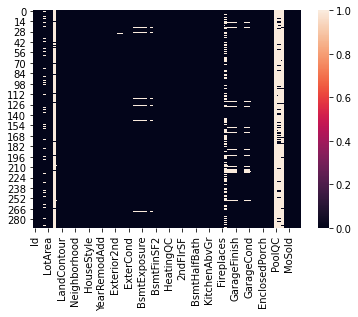

In [100]:
sns.heatmap(df_test.isnull())

In [101]:
#filling missing values in categorical columns as NA
columns = ["FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "BsmtExposure", "BsmtFinType2", "BsmtCond", "BsmtFinType1", "BsmtQual"]
df_test[columns] = df_test[columns].fillna('NA')

#filling missing values in MasVnrType with None
df_test['MasVnrType'] = df_test['MasVnrType'].fillna('None')

#filling missing values in GarageYrBlt with 0
df_test['GarageYrBlt'] = df_test['GarageYrBlt'].fillna('0')

#Imputing the missing values with their median

df_test['LotFrontage'].fillna(df_test['LotFrontage'].median(),inplace=True)
df_test['MasVnrArea'].fillna(df_test['MasVnrArea'].median(),inplace=True)

In [102]:
df_test.drop(['Id','Utilities',"PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

In [103]:
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.0,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,0,7,2007,WD,Normal
1,120,RL,65.0,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,0,8,2009,COD,Abnorml
2,20,RL,65.0,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,0,6,2009,WD,Normal
3,70,RL,75.0,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,0,7,2009,WD,Normal
4,60,RL,86.0,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,0,1,2008,WD,Normal


<AxesSubplot:>

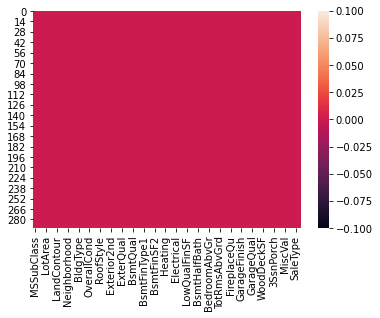

In [121]:
sns.heatmap(df_test.isnull())

In [122]:
# Checking Statistical Summary
df_test.describe()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,292.000000,292.000000,292.000000
mean,4.167808,2.136986,29.842466,116.904110,0.993151,1.958904,2.791096,3.078767,0.054795,11.681507,2.023973,0.003425,0.561644,3.017123,3.078767,2.493151,51.630137,32.424658,1.441781,0.010274,7.404110,8.780822,1.777397,20.893836,2.575342,2.876712,1.400685,2.722603,2.852740,3.003425,3.102740,61.400685,5.609589,1.698630,104.256849,100.342466,0.037671,1.15411,0.941781,2.753425,111.866438,24.037671,0.020548,116.123288,0.424658,0.065068,1.575342,0.359589,2.794521,0.05137,2.383562,3.417808,4.835616,0.595890,3.068493,2.431507,1.729452,457.458904,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,28.184932,6.232877,2007.859589
std,4.255894,0.478114,14.431823,71.619732,0.082618,1.398953,0.699182,1.541174,0.242576,6.004975,0.834876,0.058521,1.265305,1.964386,1.356147,1.063267,24.033343,18.723466,0.845466,0.130676,2.302184,3.032455,0.627357,31.084836,0.671825,0.377920,0.773531,1.306251,0.558187,1.540960,2.251321,60.645104,1.192031,5.735726,69.068514,64.311574,0.265972,1.31351,0.234559,0.804298,67.967543,34.531652,0.218372,71.013661,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,0.818685,1.728105,0.732434,0.621259,1.146682,1.926154,0.754430,210.785591,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,224.036218,2.774556,1.322867
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,2006.000000
25%,0.000000,2.000000,21.750000,54.000000,1.000000,0.000000,3.000000,2.000000,0.000000,6.000000,2.000000,0.000000,0.000000,2.000000,2.000000,2.000000,33.000000,16.000000,1.000000,0.000000,5.000000,7.000000,1.000000,0.000000,2.000000,3.000000,1.000000,2.000000,3.000000,2.000000,1.750000,0.000000,6.000000,0.000000,44.750000,45.750000,0.000000,0.00000,1.000000,3.000000,56.000000,0.000000,0.000000,50.750000,0.000000,0.000000,1.000000,0.000000,2.000000,0.00000,2.000000,2.000000,5.000000,0.000000,2.000000,1.000000,1.000000,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,4.000000,2007.000000
50%,4.000000,2.000000,29.000000,113.000000,1.000000,3.000000,3.000000,4.000000

In [115]:
df_test_copy=df_test.copy()

In [116]:
from scipy import stats
def percentile_capping(df_test, cols, from_low_end, from_high_end):
    for col in cols:
        stats.mstats.winsorize(a=df_test[col], limits=(from_low_end, from_high_end), inplace=True)

In [117]:
features=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea','BsmtFinSF1', 'BsmtFinSF2']

In [118]:
percentile_capping(df_test_copy, features, 0.01, 0.10)
df_test_copy.shape

(292, 74)

In [124]:
# Saving The model
import pickle
file = 'HOUSE PRICE.pkl'
#save file
save = pickle.dump(RandomForestRegressor,open(file,'wb'))

In [125]:
# Conclusion
rf_predict = pd.DataFrame({
    'Actual_Price' : y_test,
    'Predicted_Price' : y_pred
})

rf_predict['Error'] = rf_predict['Actual_Price'] - rf_predict['Predicted_Price']

rf_predict

,Actual_Price,Predicted_Price,Error
1075,375,338.00,37.00
208,273,291.70,-18.70
1040,406,369.14,36.86
1127,296,363.52,-67.52
1026,145,183.11,-38.11
744,397,370.24,26.76
70,273,321.41,-48.41
542,153,208.97,-55.97
1156,145,182.28,-37.28
558,38,73.02,-35.02
